# CNN (8주차) 2

SEOYEON CHOI  
2022-10-26

기계학습 특강 (8주차) 10월26일–(2) \[이미지자료분석 - Transfer Learning,
CAM (설명가능한 인공지능모형, XAI)\]

## imports

In [92]:
import torch 
import torchvision
from fastai.vision.all import * 

## Transfer Learning

In [93]:
path = untar_data(URLs.CIFAR)

In [94]:
path.ls()

(#3) [Path('/home/csy/.fastai/data/cifar10/train'),Path('/home/csy/.fastai/data/cifar10/labels.txt'),Path('/home/csy/.fastai/data/cifar10/test')]

In [95]:
!ls '/home/csy/.fastai/data/cifar10/train'

airplane  automobile  bird  cat  deer  dog  frog  horse  ship  truck

### 수제네트워크

1.  dls

In [96]:
dls = ImageDataLoaders.from_folder(path,train='train',valid='test') 

In [97]:
_X,_y = dls.one_batch()
_X.shape, _y.shape

(torch.Size([64, 3, 32, 32]), torch.Size([64]))

In [98]:
!ls '/home/csy/.fastai/data/cifar10/train' # 10개의 클래스

airplane  automobile  bird  cat  deer  dog  frog  horse  ship  truck

In [ ]:
dls.show_batch()

1.  lrnr 생성

In [9]:
net1 = torch.nn.Sequential(
    torch.nn.Conv2d(3,128,(5,5)),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d((2,2)),
    torch.nn.Flatten()
)

net는 cpu에 있고 X는 gpu에 있으니 cpu로 불러오자

In [10]:
#net1(_X.to("cpu")).shape

In [11]:
net = torch.nn.Sequential(
    net1, 
    torch.nn.Linear(25088,10)
)
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy) 

In [12]:
net.to("cuda:0")

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 128, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (3): Flatten(start_dim=1, end_dim=-1)
  )
  (1): Linear(in_features=25088, out_features=10, bias=True)
)

1.  학습

In [13]:
X,y=dls.one_batch()

In [14]:
lrnr.model(X).shape

torch.Size([64, 10])

In [15]:
lrnr.fit(10)

-   이게 생각보다 잘 안맞아요.. 70넘기 힘듬

### 전이학습 (남이 만든 네트워크)

1.  lrnr 생성

학습되어 있는 파라메터까지 같이 가져오기

In [16]:
#collapse_output
net = torchvision.models.resnet18(weights=torchvision.models.resnet.ResNet18_Weights.IMAGENET1K_V1)
net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

-   $k=1000$ 즉 1000개의 물체를 구분하는 모형임

In [17]:
net.fc = torch.nn.Linear(in_features=512, out_features=10) 

In [18]:
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy)

1.  학습

In [19]:
lrnr.fit(10) 

-   CIFAR10을 맞추기 위한 네트워크가 아님에도 불구하고 상당히 잘맞음
-   일반인이 거의 밑바닥에서 설계하는것보다 전이학습을 이용하는 것이
    효율적일 경우가 많다.

### 전이학습 다른 구현: 순수 fastai 이용

`-` 예전코드 복습

In [20]:
path = untar_data(URLs.PETS)/'images'

In [21]:
files= get_image_files(path)

In [22]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [23]:
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

In [24]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

/home/csy/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/home/csy/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)

lrnr = cnn_learner(dls,resnet34,metrics=accuracy)

In [25]:
lrnr.fine_tune(1)

`-` 사실 위의 코드가 transfer learning 이었음.

In [26]:
#collapse_output
lrnr.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

#### XAI(설명가능한 인공지능)

**딥러닝 연구의 네가지 축** - step 1. 아키텍처 - 최근 연구 특징 :
비전문가 + 블랙박스(안 보이는 의미) - 설명가능한 딥러닝에 대한 요구 -
step 2. 손실함수 - step 3. 미분계산 - step 4. 옵티마이저

## CAM

### CAM이란?

-   ref:
    http://cnnlocalization.csail.mit.edu/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf

`-` Class Activation Mapping (CAM)은 설명가능한 인공지능모형
(eXplainable Artificial Intelligence, XAI) 중 하나로 CNN의 판단근거를
시각화하는 기술

### 학습에 사용할 데이터 Load

In [27]:
path = untar_data(URLs.PETS)/'images'

In [28]:
path.ls()

(#7393) [Path('/home/csy/.fastai/data/oxford-iiit-pet/images/Bombay_13.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/beagle_193.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/Ragdoll_8.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/boxer_106.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/keeshond_56.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_162.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/saint_bernard_136.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_76.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/pug_173.jpg'),Path('/home/csy/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_117.jpg')...]

In [29]:
files= get_image_files(path)
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

### 구현0단계– 예비학습

#### `#` 하나의 이미지 선택

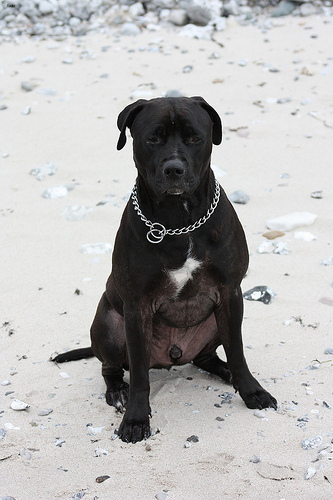

In [30]:
ximg = PILImage.create('/home/csy/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
ximg

In [31]:
x = first(dls.test_dl([ximg]))[0]
x,x.shape

(TensorImage([[[[0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
                [0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
                [0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
                ...,
                [0.8745, 0.8784, 0.8824,  ..., 0.8902, 0.8863, 0.8824],
                [0.9059, 0.8980, 0.8902,  ..., 0.8824, 0.8863, 0.8824],
                [0.8863, 0.8863, 0.8824,  ..., 0.8784, 0.8863, 0.8863]],
 
               [[0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
                [0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
                [0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
                ...,
                [0.8784, 0.8824, 0.8863,  ..., 0.8745, 0.8667, 0.8588],
                [0.9098, 0.9020, 0.8902,  ..., 0.8745, 0.8706, 0.8627],
                [0.8902, 0.8902, 0.8784,  ..., 0.8784, 0.8745, 0.8706]],
 
               [[0.9098, 0.9098, 0.9137,  ..., 0.9137, 0.9137, 0.9137],
                

#### `#` AP layer

In [32]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1) 

In [33]:
X = torch.arange(48).reshape(1,3,4,4)*1.0 
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [34]:
ap(X)

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

In [35]:
X[0,0,...].mean(),X[0,1,...].mean(),X[0,2,...].mean()

(tensor(7.5000), tensor(23.5000), tensor(39.5000))

#### `#` torch.einsum

(예시1)

In [36]:
tsr = torch.arange(12).reshape(4,3)
tsr

tensor([[ 0,  1,  2],
        [ 3,  4,  5],
        [ 6,  7,  8],
        [ 9, 10, 11]])

In [37]:
torch.einsum('ij->ji',tsr)

tensor([[ 0,  3,  6,  9],
        [ 1,  4,  7, 10],
        [ 2,  5,  8, 11]])

(예시2)

In [38]:
tsr1 = torch.arange(12).reshape(4,3).float()
tsr2 = torch.arange(15).reshape(3,5).float()

In [39]:
tsr1 @ tsr2

tensor([[ 25.,  28.,  31.,  34.,  37.],
        [ 70.,  82.,  94., 106., 118.],
        [115., 136., 157., 178., 199.],
        [160., 190., 220., 250., 280.]])

In [40]:
torch.einsum('ij,jk -> ik',tsr1,tsr2) 

tensor([[ 25.,  28.,  31.,  34.,  37.],
        [ 70.,  82.,  94., 106., 118.],
        [115., 136., 157., 178., 199.],
        [160., 190., 220., 250., 280.]])

(예시3)

In [41]:
x.to("cpu").shape

torch.Size([1, 3, 512, 512])

`torch,einsum`을 사용하여 shape을 아래로 변경

In [42]:
torch.einsum('ocij -> ijc',x.to("cpu")).shape

torch.Size([512, 512, 3])

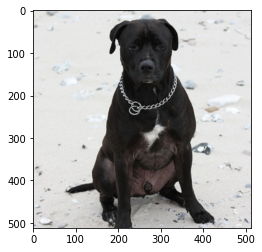

In [43]:
plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

### 구현1단계– 이미지분류 잘하는 네트워크 선택

In [44]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

lrnr = cnn_learner(dls,resnet34,metrics=accuracy)

In [45]:
lrnr.fine_tune(1)

### 구현2단계– 네트워크의 끝 부분 수정

`-` 모형의 분해

In [46]:
net1= lrnr.model[0]
net2= lrnr.model[1]

net1이 2d part, net1이 1d part

`-` net2를 좀더 살펴보자.

In [47]:
net2

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=2, bias=False)
)

In [48]:
_X, _y = dls.one_batch() 

In [49]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [50]:
print(net1(_X).shape)
print(net2[0](net1(_X)).shape)
print(net2[1](net2[0](net1(_X))).shape)
print(net2[2](net2[1](net2[0](net1(_X)))).shape)

torch.Size([64, 512, 16, 16])
torch.Size([64, 1024, 1, 1])
torch.Size([64, 1024])
torch.Size([64, 1024])

`-` net2를 아래와 같이 수정하고 재학습하자 (왜?)

In [51]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # (64,512,16,16) -> (64,512,1,1) 
    torch.nn.Flatten(), # (64,512,1,1) -> (64,512) 
    torch.nn.Linear(512,2,bias=False) # (64,512) -> (64,2) 
)

In [52]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [53]:
lrnr2= Learner(dls,net,metrics=accuracy) # loss_fn??

In [54]:
lrnr2.loss_func, lrnr.loss_func ## 알아서 기존의 loss function으로 잘 들어가 있음. 

(FlattenedLoss of CrossEntropyLoss(), FlattenedLoss of CrossEntropyLoss())

In [55]:
lrnr2.fine_tune(5) # net2를 수정해서 accuracy가 안좋아지긴 했는데 그래도 쓸만함 

### 구현3단계– 수정된 net2에서 Linear와 AP의 순서를 바꿈

`-` 1개의 observation을 고정하였을 경우 출력과정 상상

In [56]:
ximg = PILImage.create('/home/csy/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
x = first(dls.test_dl([ximg]))[0]

In [57]:
net2

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [58]:
print(net1(x).shape)
print(net2[0](net1(x)).shape)
print(net2[1](net2[0](net1(x))).shape)
print(net2[2](net2[1](net2[0](net1(x)))).shape)

torch.Size([1, 512, 16, 16])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 2])

`-` 최종결과 확인

In [59]:
net(x)

TensorImage([[-6.7946,  8.0881]], device='cuda:0', grad_fn=<AliasBackward0>)

아마 모델 달라서 값이 다른 것일까..!

In [60]:
dls.vocab

['cat', 'dog']

-   net(x)에서 뒤쪽의 값이 클수록 ’dog’를 의미한다.

`-` net2의 순서 바꾸기 전 전체 네트워크:

$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [-9.0358,  9.0926]$$

`-` 아래와 같이 순서를 바꿔서 한번 계산해보고 싶다. (왜???..)

$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [−9.0358,9.0926]$$

-   여기에서 (1,512,16,16) -\> (1,2,16,16) 로 가는 선형변환을 적용하는
    방법? **(16,16) each pixel에 대하여 (512 $\to$ 2)로 가는 변환을
    수행**

`-` 통찰: 이 경우 특이하게도 레이어의 순서를 바꿨을때 출력이 동일함
(선형변환하고 평균내거나 평균내고 선형변환하는건 같으니까)

In [61]:
_x =torch.tensor([1,2,3.14,4]).reshape(4,1)
_x 

tensor([[1.0000],
        [2.0000],
        [3.1400],
        [4.0000]])

In [62]:
_l1 = torch.nn.Linear(1,1,bias=False)
_l1(_x).mean() # _x -> 선형변환 -> 평균 

tensor(-0.2621, grad_fn=<MeanBackward0>)

In [63]:
_l1(_x.mean().reshape(1,1)) # _x -> 평균 -> 선형변환

tensor([[-0.2621]], grad_fn=<MmBackward0>)

`-` 구현해보자.

In [64]:
net2[2].weight.shape,net1(x).shape

(torch.Size([2, 512]), torch.Size([1, 512, 16, 16]))

In [65]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why.shape

torch.Size([1, 2, 16, 16])

In [66]:
net2[0](why)

TensorImage([[[[-6.7946]],

              [[ 8.0881]]]], device='cuda:0', grad_fn=<AliasBackward0>)

In [67]:
net(x)

TensorImage([[-6.7946,  8.0881]], device='cuda:0', grad_fn=<AliasBackward0>)

### 잠깐 멈추고 생각

`-` 이미지

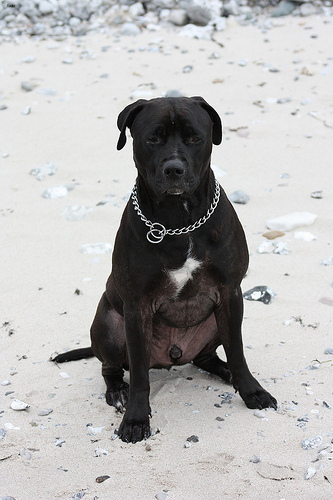

In [68]:
ximg

`-` 네트워크의 결과

In [69]:
net2(net1(x))

TensorImage([[-6.7946,  8.0881]], device='cuda:0', grad_fn=<AliasBackward0>)

-   -9.0358 \<\< 9.0926 이므로 ’ximg’는 높은 확률로 개라는 뜻이다.

내거에서는 9.0926이 10.2985

`-` 아래의 네트워크를 관찰

$$\underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [-9.0358,9.0926]$$

In [70]:
net2[0](why)

TensorImage([[[[-6.7946]],

              [[ 8.0881]]]], device='cuda:0', grad_fn=<AliasBackward0>)

더 파고들어서 분석해보자.

In [71]:
why.shape

torch.Size([1, 2, 16, 16])

In [72]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

(TensorImage(-6.7946, device='cuda:0', grad_fn=<AliasBackward0>),
 TensorImage(8.0881, device='cuda:0', grad_fn=<AliasBackward0>))

***`why[0,0,:,:]`***

In [73]:
#collapse_output
(why[0,0,:,:]).to(torch.int64)

TensorImage([[   0,    0,    0,    0,    0,    0,    0,   -1,   -1,    0,    0,
                 0,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -1,   -9,  -18,  -18,   -9,   -2,
                 0,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -8,  -31,  -51,  -44,  -25,   -8,
                 0,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,  -16,  -50,  -82,  -73,  -45,  -14,
                 0,    0,    0,    0,    0],
             [   0,    0,    0,    0,   -1,  -21,  -59,  -98, -111,  -63,  -18,
                -1,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,  -17,  -53,  -94, -100,  -60,  -18,
                -2,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,  -10,  -37,  -65,  -66,  -40,  -13,
                -2,   -1,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -6,  -25,  -43,  -34,  -16,   -4,
                -2,   -1,   -1,    0,    0],


-   이 값들의 평균은 -9.0358 이다. (이 값이 클수록 이 그림이 고양이라는
    의미 = 이 값이 작을수록 이 그림이 고양이가 아니라는 의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 작은값이 있어서 -9.0358이라는 평균값이 나옴
    $\to$ 특정위치에 존재하는 엄청 작은 값들은 ximg가 고양이가 아니라고
    판단하는 근거가 된다.

***`why[0,1,:,:]`***

In [74]:
#collapse_output
(why[0,1,:,:]).to(torch.int64)

TensorImage([[  0,   0,   0,   0,   0,   0,   0,   2,   2,   1,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   1,  11,  21,  21,  11,   3,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   9,  35,  61,  53,  30,  11,   1,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,  19,  58,  95,  87,  54,  17,   1,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   1,  24,  68, 114, 132,  75,  22,   1,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   1,  20,  61, 109, 118,  72,  21,   2,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,  12,  43,  75,  77,  46,  15,   3,   1,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   7,  28,  50,  39,  18,   5,   2,   2,
                1,   0,   0],
             [  0,   0,   0,   0,   0,   6,  19,  26,  17,   5,   1,   1,   1,
                0,   0,   0],
             [  0, 

-   이 값들의 평균은 9.0926 이다. (이 값이 클수록 이 그림이 강아지라는
    의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 값들이 있어서 9.0926이라는 평균값이 나옴 $\to$
    특정위치에 존재하는 엄청 큰 값들은 결국 ximg를 강아지라고 판단하는
    근거가 된다.

`-` 시각화

In [75]:
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

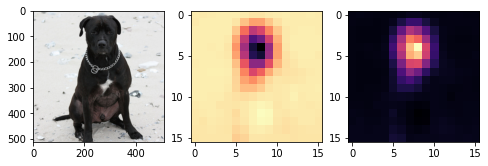

In [76]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma')

-   magma = 검은색 \< 보라색 \< 빨간색 \< 노란색
-   왼쪽그림의 검은 부분은 고양이가 아니라는 근거, 오른쪽그림의
    노란부분은 강아지라는 근거

`-` why_cat, why_dog를 (16,16) $\to$ (512,512) 로 resize

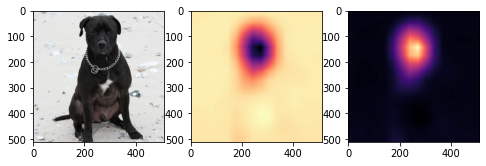

In [77]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

`-` 겹쳐그리기

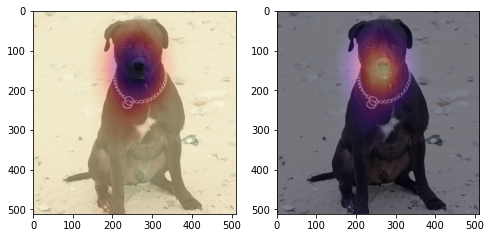

In [78]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화

In [79]:
!wget https://github.com/guebin/DL2022/blob/master/_notebooks/2022-09-06-hani01.jpeg

--2022-11-02 23:41:24--  https://github.com/guebin/DL2022/blob/master/_notebooks/2022-09-06-hani01.jpeg
Resolving github.com (github.com)... 20.200.245.247
Connecting to github.com (github.com)|20.200.245.247|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘2022-09-06-hani01.jpeg’

2022-09-06-hani01.j     [ <=>                ] 134.25K  --.-KB/s    in 0.02s   

2022-11-02 23:41:24 (8.09 MB/s) - ‘2022-09-06-hani01.jpeg’ saved [137470]


In [80]:
#
#!wget https://github.com/guebin/DL2022/blob/master/_notebooks/2022-09-06-hani01.jpeg?raw=true
ximg= PILImage.create('2022-09-07-dogs.jpeg')
x= first(dls.test_dl([ximg]))[0]

In [81]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

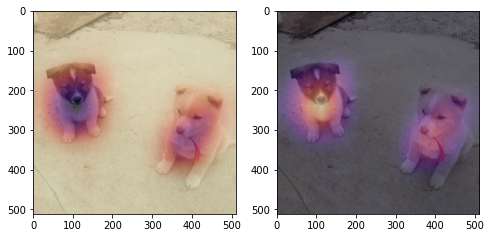

In [82]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화 with prob

In [83]:
sftmax=torch.nn.Softmax(dim=1)

In [84]:
sftmax(net(x))

TensorImage([[1.1767e-09, 1.0000e+00]], device='cuda:0',
            grad_fn=<AliasBackward0>)

In [85]:
catprob, dogprob = sftmax(net(x))[0,0].item(), sftmax(net(x))[0,1].item()

Text(0.5, 1.0, 'dogprob=1.000000')

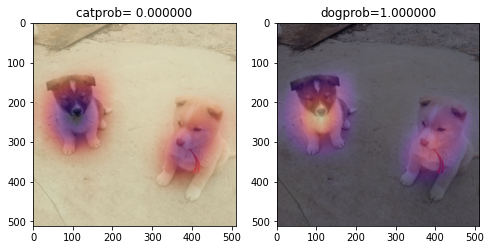

In [86]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[0].set_title('catprob= %f' % catprob) 
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].set_title('dogprob=%f' % dogprob)

### 구현4단계– CAM 시각화

In [87]:
sftmax = torch.nn.Softmax(dim=1)

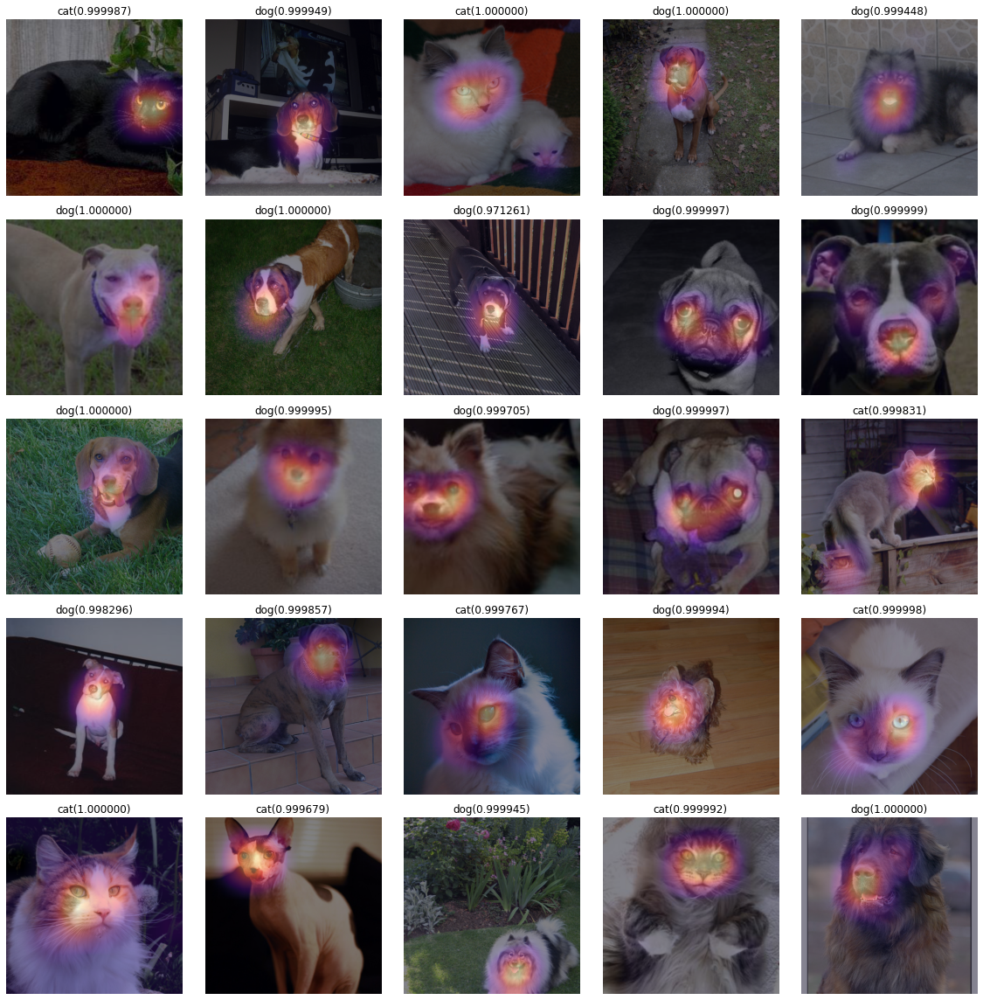

In [88]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

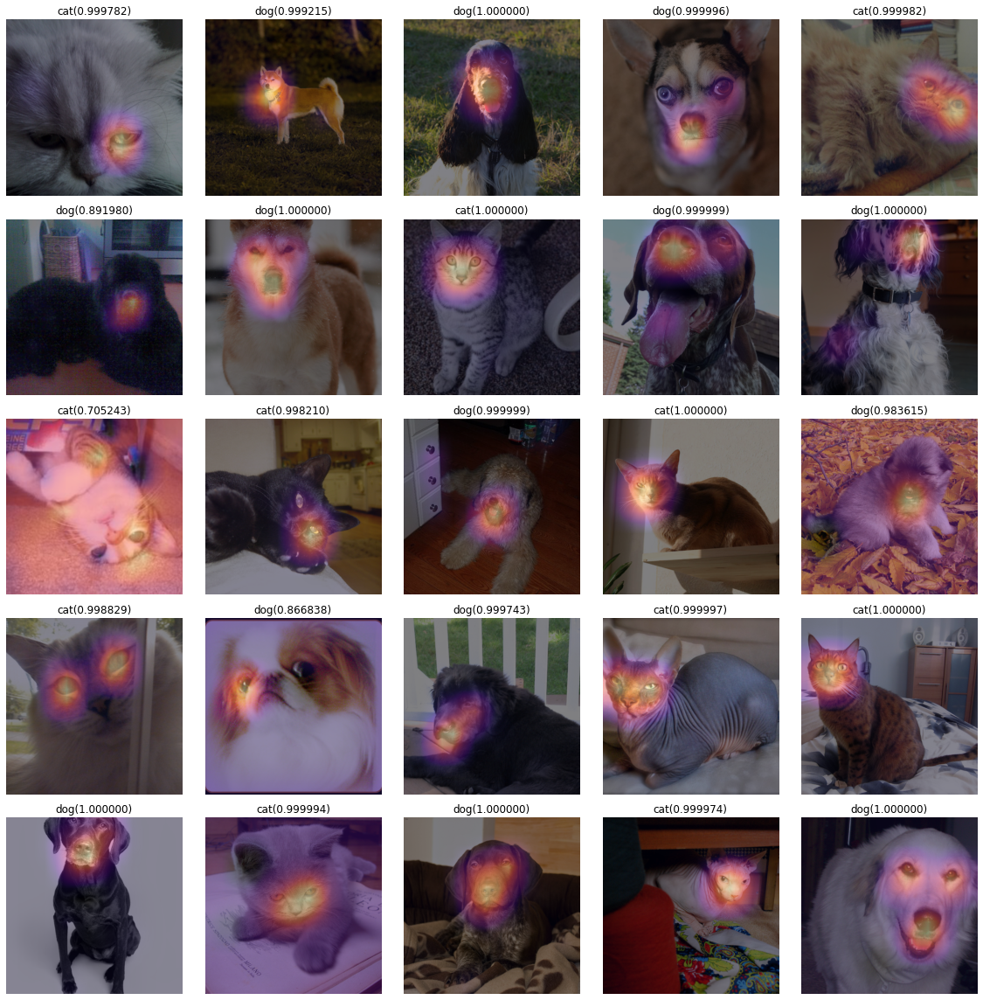

In [89]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

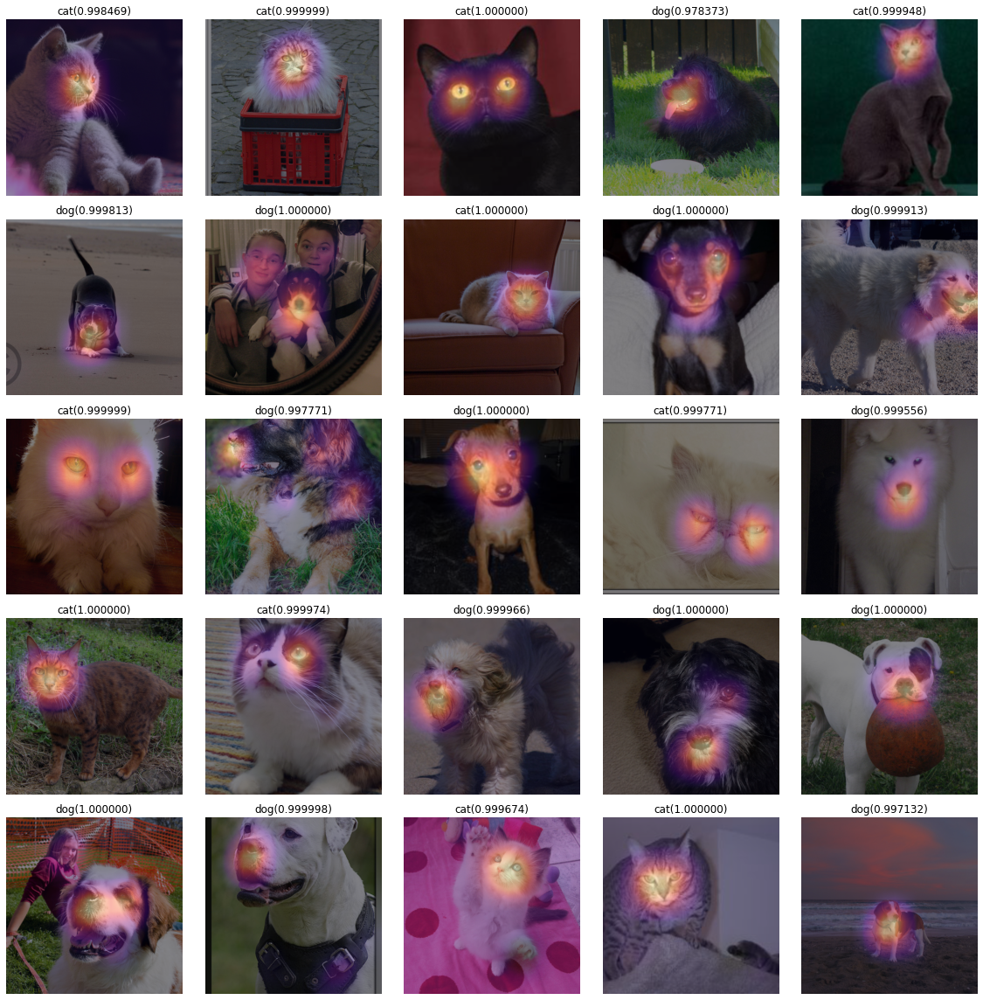

In [90]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

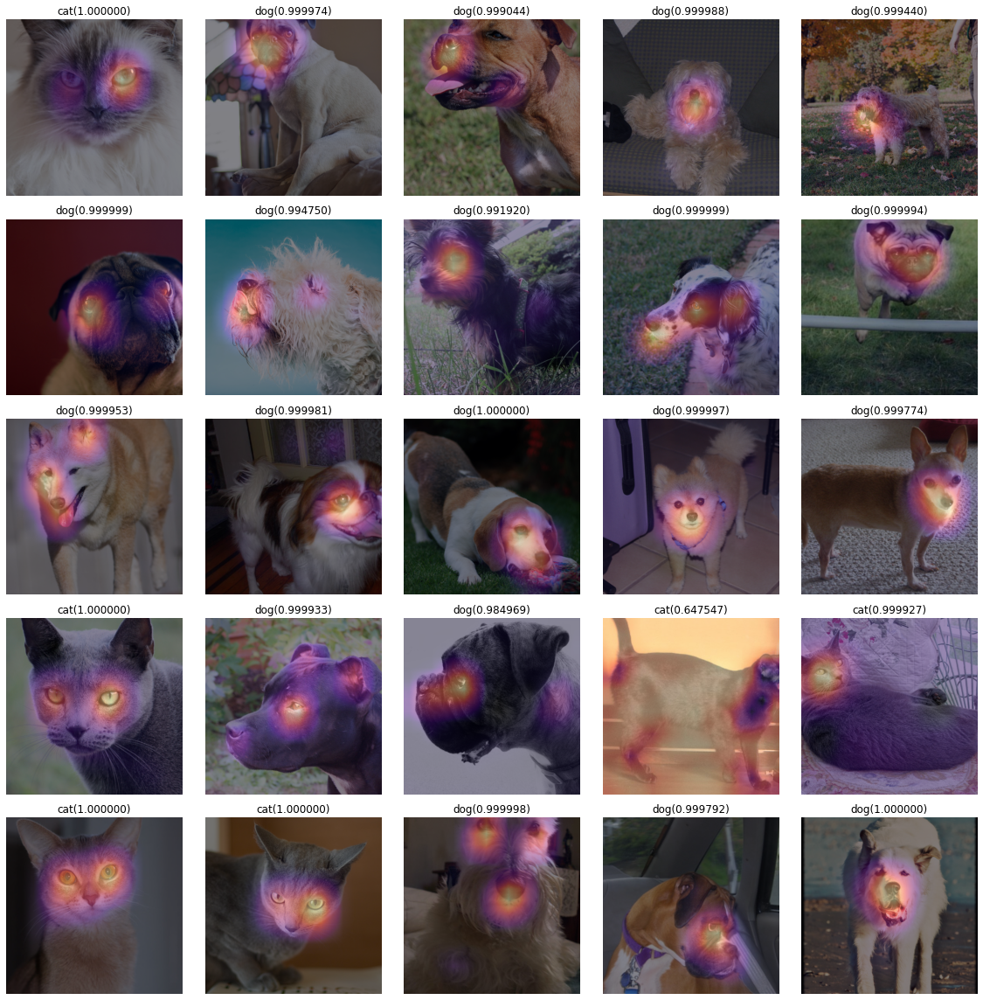

In [91]:
fig, ax = plt.subplots(5,5) 
k=75
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()